#**Transductive node classification on Pubmed dataset with Graph Attention Networks** 

---



---
The following code implements node classification on Pubmed citation graph, using `torch` and `torch-geometric` Python libraries. The experiment defines two different networks, `GatNet1` made up of 2 Graph Attention (GAT) layers, and `GatNet2` made up of 3 Graph Attention layers. Starting by the definition of those networks, different models were experimented, obtained by tuning hyperparameters.



##Import libraries

Install `torch-geometric` and `networkx`

In [0]:
!pip install torch-scatter==latest+cu101 torch-sparse==latest+cu101 -f https://s3.eu-central-1.amazonaws.com/pytorch-geometric.com/whl/torch-1.4.0.html
!pip install torch_geometric
!pip install networkx

Looking in links: https://s3.eu-central-1.amazonaws.com/pytorch-geometric.com/whl/torch-1.4.0.html
     |████████████████████████████████| 10.6MB 6.7MB/s 
     |████████████████████████████████| 15.2MB 204kB/s 
     |████████████████████████████████| 133kB 4.8MB/s 
     |████████████████████████████████| 348kB 17.1MB/s 
     |████████████████████████████████| 51kB 6.3MB/s 
  Created wheel for torch-geometric: filename=torch_geometric-1.4.3-cp36-none-any.whl size=234873 sha256=bab4c10ed8eb264b69af0f62ddd4361d9d2aefec447bcb6b8b80a1e16dedac9b
  Stored in directory: /root/.cache/pip/wheels/e2/c1/09/8693feee3f97e440d68b09abfca8b4c1e97150ace350b5003f
Successfully built torch-geometric


In [0]:
import numpy as np
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch_geometric
import matplotlib.pyplot as plt
import networkx as nx

## Definition of GAT networks
The networks are implemented using `pytorch-geometric` library, exploiting the *Message Passing* paradigm


### GAT layer

In [0]:
from torch.nn import Parameter
from torch_geometric.nn.conv import MessagePassing
from torch_geometric.utils import softmax


class GatLayer(MessagePassing):

  def __init__(self, input_size, output_size, heads,
                 negative_slope, dropout, concat=True, **kwargs):
    super(GatLayer, self).__init__(aggr='add', **kwargs)

    self.input_size = input_size
    self.output_size = output_size
    self.heads = heads
    self.concat = concat
    self.negative_slope = negative_slope
    self.dropout = dropout

    #Parameters
    self.W = Parameter(torch.Tensor(input_size, heads * output_size))
    self.a = Parameter(torch.Tensor(1, heads, 2 * output_size))

    #Glorot weight initialization
    nn.init.xavier_uniform_(self.W.data, gain=1.414)
    nn.init.xavier_uniform_(self.a.data, gain=1.414)
  
  
  def forward(self, x, edge_index, size=None):

    #linear combination
    x = torch.matmul(x, self.W)

    #initial call to start propagating the message (edge attention) to neighbors
    return self.propagate(edge_index, size=size, x=x)

  
  def message(self, edge_index_i, x_i, x_j, size_i):
    
    #Use view method to reshape
    x_j = x_j.view(-1, self.heads, self.output_size)
    x_i = x_i.view(-1, self.heads, self.output_size)

    #linear combination of the concatenation between node features and its neighbors'
    alpha = (torch.cat([x_i, x_j], dim=-1) * self.a).sum(dim=-1)
    #Leaky ReLU
    alpha = F.leaky_relu(alpha, self.negative_slope)
    #exponential normalization with softmax
    alpha = softmax(alpha, edge_index_i, size_i)
    #dropout on normalized attention coefficients
    alpha = F.dropout(alpha, p=self.dropout, training=self.training)

    return x_j * alpha.view(-1, self.heads, 1)
  

  def update(self, aggr_out):

    if self.concat is True:
      aggr_out = aggr_out.view(-1, self.heads * self.output_size)
    else:
      #mean of all attentions
      aggr_out = aggr_out.mean(dim=1)
    #return new node features, updated with neighbors' information
    return aggr_out

    
  def __repr__(self):
    return '{}({}, {}, heads={})'.format(self.__class__.__name__, 
                                         self.input_size, self.output_size, 
                                         self.heads)



### GAT networks

**GatNet1** : two GAT layers

In [0]:
class GatNet1(nn.Module):

  def __init__(self, input_size, hidden_size, output_size, dropout, heads_1,
               heads_2):
    super(GatNet1, self).__init__()
    self.input_size = input_size
    self.hidden_size = hidden_size
    self.output_size = output_size
    self.dropout = dropout
    self.heads_1 = heads_1
    self.heads_2 = heads_2

    self.Gat1 = GatLayer(input_size=self.input_size, output_size=self.hidden_size, 
                         heads=self.heads_1, dropout=self.dropout, negative_slope=0.2)
    self.Gat2 = GatLayer(input_size=self.hidden_size*self.heads_1, 
                         output_size=self.output_size, heads=self.heads_2, 
                         dropout=self.dropout, concat=False, negative_slope=0.2)
  

  def forward(self,data):
    x, edge_index = data.x, data.edge_index

    x = F.dropout(x, p=self.dropout, training=self.training)
    x = self.Gat1(x, edge_index)
    x = F.elu(x)
    x = F.dropout(x, p=self.dropout, training=self.training)
    x = self.Gat2(x, edge_index)
    x = F.log_softmax(x, dim=1)

    return x

**GatNet2** : three GAT layers

In [0]:
class GatNet2(nn.Module):

  def __init__(self, input_size, hidden1_size, hidden2_size, output_size, dropout, 
               heads_1, heads_2, heads_3):
    super(GatNet2, self).__init__()
    self.input_size = input_size
    self.hidden1_size = hidden1_size
    self.hidden2_size = hidden2_size
    self.output_size = output_size
    self.dropout = dropout
    self.heads_1 = heads_1
    self.heads_2 = heads_2
    self.heads_3 = heads_3

    self.Gat1 = GatLayer(input_size=self.input_size, output_size=self.hidden1_size, 
                         heads=self.heads_1, dropout=self.dropout, negative_slope=0.2)
    self.Gat2 = GatLayer(input_size=self.hidden1_size*self.heads_1, 
                         output_size=self.hidden2_size, heads=self.heads_2, 
                         dropout=self.dropout, negative_slope=0.2)
    self.Gat3 = GatLayer(input_size=self.hidden2_size*self.heads_2, 
                         output_size=self.output_size, heads=self.heads_3,
                         dropout=self.dropout, concat=False, negative_slope=0.2)
  

  def forward(self,data):
    x, edge_index = data.x, data.edge_index

    x = F.dropout(x, p=self.dropout, training=self.training)
    x = self.Gat1(x, edge_index)
    x = F.elu(x)
    x = F.dropout(x, p=self.dropout, training=self.training)
    x = self.Gat2(x, edge_index)
    x = F.elu(x)
    x = F.dropout(x, p=self.dropout, training=self.training)
    x = self.Gat3(x, edge_index)
    x = F.log_softmax(x, dim=1)

    return x

## Definition of useful functions

### Accuracy function

In [0]:
def accuracy(output, labels):
  preds = output.max(1)[1].type_as(labels)
  correct = preds.eq(labels).double()
  correct = correct.sum()
  return correct / len(labels)



### Train function (with Early Stopping)

In [0]:
def train_early_stop(model, data, patience, n_epochs):
  
  t_total = time.time()
  loss_values_train = []
  acc_values_train = []
  loss_values = []
  acc_values = []
  indices = []
  counter = 0
  best_epoch = 0
  best_loss = n_epochs

  for epoch in range(1, n_epochs):
    t = time.time()
    model.train()
    optimizer.zero_grad()
    out = model(data)
    loss_train = F.nll_loss(out[data.train_mask], data.y[data.train_mask])
    acc_train = accuracy(out[data.train_mask], data.y[data.train_mask])
    loss_train.backward()
    optimizer.step()

    model.eval() #deactivates layer's dropout
    out = model(data)
    loss_val = F.nll_loss(out[data.val_mask], data.y[data.val_mask])
    acc_val = accuracy(out[data.val_mask], data.y[data.val_mask])

    print('Epoch: {:04d}'.format(epoch),
          'LOSS_TRAIN: {:.4f}'.format(loss_train.data.item()),
          'ACC_TRAIN: {:.4f}'.format(acc_train.data.item()),
          'LOSS_VAL: {:.4f}'.format(loss_val.data.item()),
          'ACC_VAL: {:.4f}'.format(acc_val.data.item()),
          'time: {:.4f}s'.format(time.time() - t))
    
    loss_values.append(loss_val.data.item())
    loss_values_train.append(loss_train.data.item())
    acc_values.append(acc_val.data.item())
    acc_values_train.append(acc_train.data.item())
    indices.append(epoch)
    torch.save(model.state_dict(), '{}.model'.format(epoch))

    #Early stopping
    if loss_values[-1] < best_loss:
      best_loss = loss_values[-1]
      best_epoch = epoch
      counter = 0
    else:
      counter += 1
    if counter == patience:
      break

  return model, indices, loss_values_train, acc_values_train, loss_values, acc_values


###Plot validation/train loss and accuracy

In [0]:
def plot_val_loss_acc(indices, arg1, arg2):
  plt.plot(indices, arg1, label='validation')
  plt.plot(indices, arg2, label='train')
  plt.xlabel('Epoch')
  plt.grid(True)
  plt.legend()
  plt.show()

### Model evaluation on test set

In [0]:
def evaluate(model, data, i):
  model.eval()
  pred = model(data)
  acc = accuracy(pred[data.test_mask], data.y[data.test_mask])
  print('Accuracy (model %d): {:.4f}'.format(acc) %(i))

## Import the dataset

Pubmed built-in dataset is imported using the class `Planetoid` in `torch_geometric.datasets`. 

In Pubmed, the nodes represent papers and the edges represent citations. The dataset is already divided into training, validation and test sets, to perform transductive learning.

In [0]:
from torch_geometric.datasets import Planetoid

#download Cora dataset
dataset = Planetoid(root='/tmp/Pubmed', name='Pubmed')
data = dataset[0]

Processing...
Done!


**Graphical representation**

Using `matplotlib`, it is possible to show the graphical representation of Pubmed citation graph, in a `networkx` format.

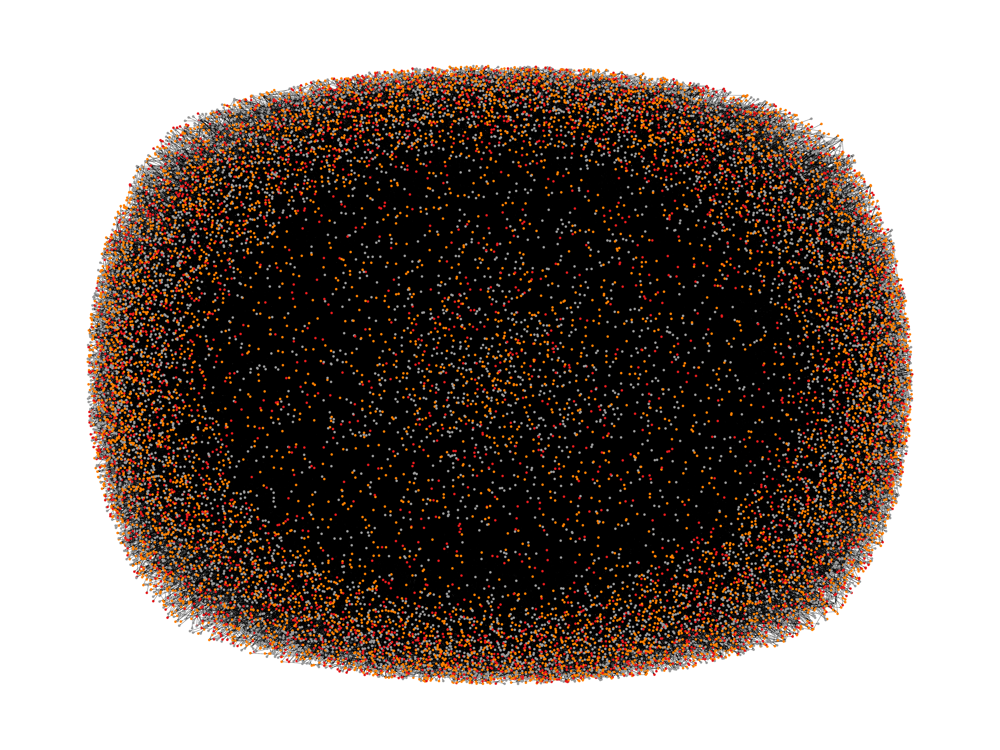

In [0]:
from torch_geometric.utils.convert import to_networkx

graph = to_networkx(data)
node_labels = data.y[list(graph.nodes)].numpy()

plt.figure(1,figsize=(80,60)) 
pos = nx.spring_layout(graph,k=0.15,iterations=20)
nx.draw(graph, pos=pos, cmap=plt.get_cmap('Set1'), node_color=node_labels, 
        node_size=75, linewidths=6)

plt.savefig('Gnx_Pubmed.png')
plt.show()

**Pytorch-geometric representation**

The imported Pubmed graph is an instance of `torch_geometric.data.Data` class. 

A `Data` object holds all information needed to define an arbitrary graph. Such information can be accessed by using attributes and methods of these classes.  

In [0]:
print(data) 

Data(edge_index=[2, 88648], test_mask=[19717], train_mask=[19717], val_mask=[19717], x=[19717, 500], y=[19717])


In [0]:
print("Number of graphs in the dataset: %d" %(len(dataset)))
print("Number of classes: %d" %(dataset.num_classes))
print("Number of features for each node: %d" %(dataset.num_node_features))
print("Number of nodes: %d" %(data.num_nodes))
print("Number of target values: %d" %(len(data.y)))
print("Number of edges: %d" %((data.num_edges)))

print("data.is_undirected() = %s" %(data.is_undirected()))
print("data.contains_isolated_nodes(): %s" %(data.contains_isolated_nodes()))
print("data.contains_self_loops(): %s" %(data.contains_self_loops())) 

Number of graphs in the dataset: 1
Number of classes: 3
Number of features for each node: 500
Number of nodes: 19717
Number of target values: 19717
Number of edges: 88648
data.is_undirected() = True
data.contains_isolated_nodes(): False
data.contains_self_loops(): False


The splitting into training, validation and test sets is performed introducing the following additional binary attributes to the Data object:

- `data.train_mask` denotes against which nodes to train (60 nodes)
- `data.val_mask` denotes which nodes to use for validation, e.g., to perform early stopping (500 nodes)
- `data.test_mask` denotes against which nodes to test (1000 nodes)

In [0]:
print("Size of the training set: %s" %(data.train_mask.sum().item()))
print("Size of the validation set: %s" %(data.val_mask.sum().item()))
print("Size of the test set: %s" %(data.test_mask.sum().item()))

print("data.train_mask is a boolean tensor: %s" %(data.train_mask))

Size of the training set: 60
Size of the validation set: 500
Size of the test set: 1000
data.train_mask is a boolean tensor: tensor([ True,  True,  True,  ..., False, False, False])


- `data.x` is a tensor containing TF/IDF weighted word vectors from a dictionary which consists of 500 unique words.
- `data.y` is a tensor containing the encoded target values, such that:
  
  0 =  Diabetes Mellitus Experimental

  1 =  Diabetes Mellitus Type 1
  
  2 =  Diabetes Mellitus Type 2
  

- `data.edge_index` is a tensor in COO format, representing how nodes are connected in the graph



In [0]:
print("data.x: %s " %(data.x))
print("data.y: %s" %(data.y))
print("data.edge_index: %s" %(data.edge_index))

data.x: tensor([[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1046, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 0.0194, 0.0080,  ..., 0.0000, 0.0000, 0.0000],
        [0.1078, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0266, 0.0000,  ..., 0.0000, 0.0000, 0.0000]]) 
data.y: tensor([1, 1, 0,  ..., 2, 0, 2])
data.edge_index: tensor([[    0,     0,     0,  ..., 19714, 19715, 19716],
        [ 1378,  1544,  6092,  ..., 12278,  4284, 16030]])


Print an example:

In [0]:
print("%s with ID 1020 has target %s" %(data.x[1020], data.y[1020]))

tensor([0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0147, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0382, 0.0000, 0.0000, 0.0172, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0374, 0.0000, 0.0000, 0.0447, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0791,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0317, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0225,
        0.0000, 0.0000, 0.0362, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0229,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 

**Add self loops**

Self loops (edges going from each node to itself) are needed to compute attention coefficients.

In [0]:
from torch_geometric.utils import add_self_loops

print("Before adding self loops: data.contains_self_loops()= %s" 
      %(data.contains_self_loops()))
data.edge_index, _ =add_self_loops(edge_index=data.edge_index)
print("After adding self loops: data.contains_self_loops()= %s" 
      %(data.contains_self_loops()))

Before adding self loops: data.contains_self_loops()= False
After adding self loops: data.contains_self_loops()= True


##Model creation and training

In [0]:
input_size = dataset.num_node_features
output_size = dataset.num_classes

### Model 1 (GatNet1)

Instanciate an empty model

In [0]:
model_1 = GatNet1(input_size=input_size, hidden_size=8, output_size=output_size, 
               dropout=0.6, heads_1=8, heads_2=1)
optimizer = torch.optim.Adam(model_1.parameters(), lr=0.005, weight_decay=5e-4)

print(model_1)

params = sum(p.numel() for p in model_1.parameters() if p.requires_grad)
print("Number of trainable parameters: %d" %(params))

GatNet1(
  (Gat1): GatLayer(500, 8, heads=8)
  (Gat2): GatLayer(64, 3, heads=1)
)


Train the model with the dataset



In [0]:
model_1, indices_1, loss_train_1, acc_train_1, loss_values_1, acc_values_1 = train_early_stop(model_1, data, 
                                                             patience=100, 
                                                             n_epochs=500)

Epoch: 0001 LOSS_TRAIN: 1.1025 ACC_TRAIN: 0.2667 LOSS_VAL: 1.0781 ACC_VAL: 0.6120 time: 1.2015s
Epoch: 0002 LOSS_TRAIN: 1.0856 ACC_TRAIN: 0.3833 LOSS_VAL: 1.0650 ACC_VAL: 0.6780 time: 0.9938s
Epoch: 0003 LOSS_TRAIN: 1.0609 ACC_TRAIN: 0.5833 LOSS_VAL: 1.0515 ACC_VAL: 0.7260 time: 0.9730s
Epoch: 0004 LOSS_TRAIN: 1.0370 ACC_TRAIN: 0.6000 LOSS_VAL: 1.0382 ACC_VAL: 0.7380 time: 0.9693s
Epoch: 0005 LOSS_TRAIN: 1.0126 ACC_TRAIN: 0.7500 LOSS_VAL: 1.0251 ACC_VAL: 0.7560 time: 0.9529s
Epoch: 0006 LOSS_TRAIN: 0.9951 ACC_TRAIN: 0.7167 LOSS_VAL: 1.0124 ACC_VAL: 0.7600 time: 0.9618s
Epoch: 0007 LOSS_TRAIN: 0.9792 ACC_TRAIN: 0.7333 LOSS_VAL: 0.9998 ACC_VAL: 0.7660 time: 0.9611s
Epoch: 0008 LOSS_TRAIN: 0.9919 ACC_TRAIN: 0.7000 LOSS_VAL: 0.9875 ACC_VAL: 0.7560 time: 0.9678s
Epoch: 0009 LOSS_TRAIN: 0.9680 ACC_TRAIN: 0.7000 LOSS_VAL: 0.9756 ACC_VAL: 0.7520 time: 0.9441s
Epoch: 0010 LOSS_TRAIN: 0.9060 ACC_TRAIN: 0.7167 LOSS_VAL: 0.9632 ACC_VAL: 0.7560 time: 0.9563s
Epoch: 0011 LOSS_TRAIN: 0.9122 ACC_TRAIN

### Model 2 (GatNet1)

Instanciate an empty model

In [0]:
model_2 = GatNet1(input_size=input_size, hidden_size=12, output_size=output_size, 
               dropout=0.6, heads_1=10, heads_2=3)
optimizer = torch.optim.Adam(model_2.parameters(), lr=0.005, weight_decay=0.005)

print(model_2)

params = sum(p.numel() for p in model_2.parameters() if p.requires_grad)
print("Number of trainable parameters: %d" %(params))

GatNet1(
  (Gat1): GatLayer(500, 12, heads=10)
  (Gat2): GatLayer(120, 3, heads=3)
)


Train the model with the dataset

In [0]:
model_2, indices_2, loss_train_2, acc_train_2, loss_values_2, acc_values_2 = train_early_stop(model_2, data, 
                                                             patience=100, 
                                                             n_epochs=500)

Epoch: 0001 LOSS_TRAIN: 1.1098 ACC_TRAIN: 0.2833 LOSS_VAL: 1.0966 ACC_VAL: 0.3900 time: 1.7591s
Epoch: 0002 LOSS_TRAIN: 1.0852 ACC_TRAIN: 0.4333 LOSS_VAL: 1.0917 ACC_VAL: 0.5040 time: 1.7923s
Epoch: 0003 LOSS_TRAIN: 1.0863 ACC_TRAIN: 0.4500 LOSS_VAL: 1.0874 ACC_VAL: 0.5820 time: 1.7568s
Epoch: 0004 LOSS_TRAIN: 1.0829 ACC_TRAIN: 0.5667 LOSS_VAL: 1.0831 ACC_VAL: 0.6640 time: 1.7554s
Epoch: 0005 LOSS_TRAIN: 1.0739 ACC_TRAIN: 0.6667 LOSS_VAL: 1.0792 ACC_VAL: 0.7180 time: 1.7506s
Epoch: 0006 LOSS_TRAIN: 1.0695 ACC_TRAIN: 0.6333 LOSS_VAL: 1.0755 ACC_VAL: 0.7400 time: 1.7610s
Epoch: 0007 LOSS_TRAIN: 1.0523 ACC_TRAIN: 0.7333 LOSS_VAL: 1.0717 ACC_VAL: 0.7480 time: 1.7572s
Epoch: 0008 LOSS_TRAIN: 1.0566 ACC_TRAIN: 0.7000 LOSS_VAL: 1.0679 ACC_VAL: 0.7540 time: 1.7822s
Epoch: 0009 LOSS_TRAIN: 1.0526 ACC_TRAIN: 0.6333 LOSS_VAL: 1.0641 ACC_VAL: 0.7540 time: 1.7659s
Epoch: 0010 LOSS_TRAIN: 1.0366 ACC_TRAIN: 0.7833 LOSS_VAL: 1.0602 ACC_VAL: 0.7600 time: 1.7736s
Epoch: 0011 LOSS_TRAIN: 1.0310 ACC_TRAIN

### Model 3 (GatNet2)

Instanciate an empty model

In [0]:
model_3 = GatNet2(input_size=input_size, hidden1_size=8, hidden2_size=8,
               output_size=output_size, dropout=0.7, heads_1=8, heads_2=8,
               heads_3=4)
optimizer = torch.optim.Adam(model_3.parameters(), lr=0.005, weight_decay=0.01)

print(model_3)

params = sum(p.numel() for p in model_3.parameters() if p.requires_grad)
print("Number of trainable parameters: %d" %(params))

GatNet2(
  (Gat1): GatLayer(500, 8, heads=8)
  (Gat2): GatLayer(64, 8, heads=8)
  (Gat3): GatLayer(64, 3, heads=4)
)


Train the model with the dataset

In [0]:
model_3, indices_3, loss_train_3, acc_train_3, loss_values_3, acc_values_3 = train_early_stop(model_3, data, 
                                                             patience=100, 
                                                             n_epochs=500)

Epoch: 0001 LOSS_TRAIN: 1.1227 ACC_TRAIN: 0.4667 LOSS_VAL: 1.0975 ACC_VAL: 0.3560 time: 1.9267s
Epoch: 0002 LOSS_TRAIN: 1.1325 ACC_TRAIN: 0.3500 LOSS_VAL: 1.0943 ACC_VAL: 0.4160 time: 1.9520s
Epoch: 0003 LOSS_TRAIN: 1.1054 ACC_TRAIN: 0.3167 LOSS_VAL: 1.0913 ACC_VAL: 0.4720 time: 1.9327s
Epoch: 0004 LOSS_TRAIN: 1.0846 ACC_TRAIN: 0.3833 LOSS_VAL: 1.0886 ACC_VAL: 0.5540 time: 1.9069s
Epoch: 0005 LOSS_TRAIN: 1.1038 ACC_TRAIN: 0.2667 LOSS_VAL: 1.0863 ACC_VAL: 0.6140 time: 1.9535s
Epoch: 0006 LOSS_TRAIN: 1.0603 ACC_TRAIN: 0.4667 LOSS_VAL: 1.0841 ACC_VAL: 0.6420 time: 1.9410s
Epoch: 0007 LOSS_TRAIN: 1.0866 ACC_TRAIN: 0.4167 LOSS_VAL: 1.0819 ACC_VAL: 0.6780 time: 1.9353s
Epoch: 0008 LOSS_TRAIN: 1.0755 ACC_TRAIN: 0.4333 LOSS_VAL: 1.0798 ACC_VAL: 0.6880 time: 1.9438s
Epoch: 0009 LOSS_TRAIN: 1.0719 ACC_TRAIN: 0.5000 LOSS_VAL: 1.0780 ACC_VAL: 0.6960 time: 1.9275s
Epoch: 0010 LOSS_TRAIN: 1.0586 ACC_TRAIN: 0.5833 LOSS_VAL: 1.0763 ACC_VAL: 0.6980 time: 1.9170s
Epoch: 0011 LOSS_TRAIN: 1.0770 ACC_TRAIN

## Models comparison and evaluation

Plot training histories

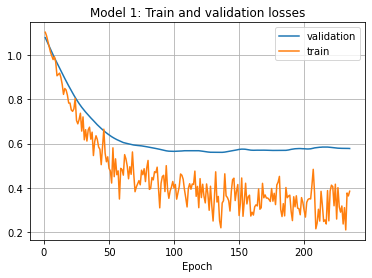

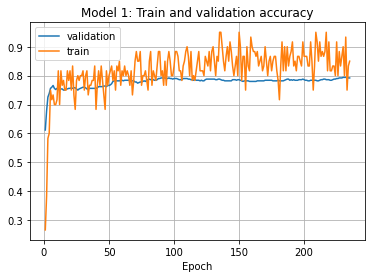

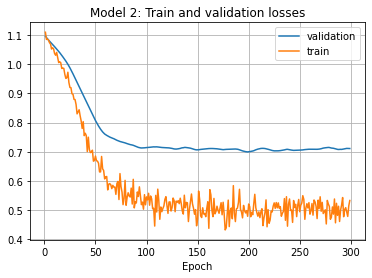

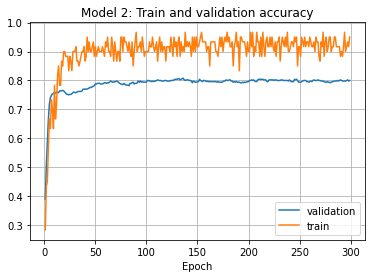

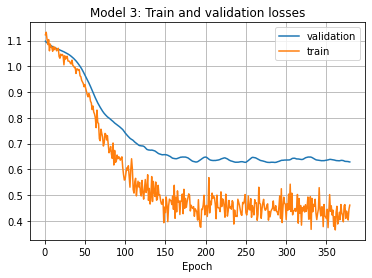

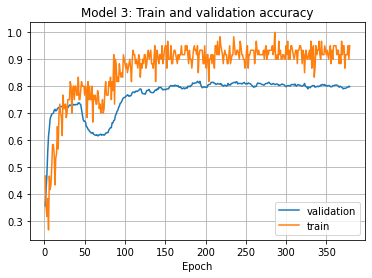

In [0]:
#model 1
plt.title('Model 1: Train and validation losses')
plot_val_loss_acc(indices_1, loss_values_1, loss_train_1)

plt.title('Model 1: Train and validation accuracy')
plot_val_loss_acc(indices_1, acc_values_1, acc_train_1)

#model 2
plt.title('Model 2: Train and validation losses')
plot_val_loss_acc(indices_2, loss_values_2, loss_train_2)

plt.title('Model 2: Train and validation accuracy')
plot_val_loss_acc(indices_2, acc_values_2, acc_train_2)

#model 3
plt.title('Model 3: Train and validation losses')
plot_val_loss_acc(indices_3, loss_values_3, loss_train_3)

plt.title('Model 3: Train and validation accuracy')
plot_val_loss_acc(indices_3, acc_values_3, acc_train_3)

Validation loss comparison

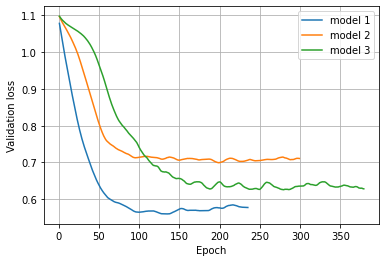

In [0]:
plt.plot(indices_1, loss_values_1, label='model 1')
plt.plot(indices_2, loss_values_2, label='model 2')
plt.plot(indices_3, loss_values_3, label='model 3')

plt.ylabel('Validation loss')
plt.xlabel('Epoch')
plt.grid(True)
plt.legend()
plt.show()

Validation accuracy comparison

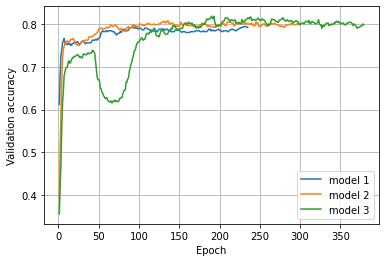

In [0]:
plt.plot(indices_1, acc_values_1, label='model 1')
plt.plot(indices_2, acc_values_2, label='model 2')
plt.plot(indices_3, acc_values_3, label='model 3')

plt.ylabel('Validation accuracy')
plt.xlabel('Epoch')
plt.grid(True)
plt.legend()
plt.show()

Evaluation on test set

In [0]:
evaluate(model_1, data, 1)
evaluate(model_2, data, 2)
evaluate(model_3, data, 3)


Accuracy (model 1): 0.7760
Accuracy (model 2): 0.7750
Accuracy (model 3): 0.7850
